# Run Group D BPM current calibrations

This notebook is used to compute the corrections for the Beam Position Monitor (BPM) currents for Run Group D, and subsequently use these corrected BPM values to study the Faraday Cup, which had poor readout due to a leak in the vacuum.

For the BPM calibrations, please reference [CLAS-Note 2018-003](https://misportal.jlab.org/mis/physics/clas12/viewFile.cfm/2018-003.7gev.pdf?documentId=57) and [CLAS-Note 2018-004](https://misportal.jlab.org/mis/physics/clas12/viewFile.cfm/2018-004.pdf?documentId=58), by Rafael Paremuzyan and Stepan Stepanyan.

The log book entries for the RGD run that are relevant:

October 8, 2023:
* Day Shift Summary - https://logbooks.jlab.org/entry/4195353:
* 13:50 - "Rafo will do beam stopper calibration"
* 14:10 - "Doing beam stopper calibration.
* 14:42 - https://logbooks.jlab.org/entry/4195533  -- Beamline overview shows that it is empty target.

In [1]:
from IPython.display import Markdown, display
import ROOT as R
import numpy as np
from datetime import datetime, timedelta
import pandas as pd
from pandas import HDFStore
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import plotly.offline as pyo
import plotly.express as px
from scipy import odr
from scipy.stats import linregress

pio.templates.default="plotly_white"
#pio.renderers.default = 'browser'  # Alternate: 'browser' opens new browser window with plots.
pyo.init_notebook_mode()

## Fetch the Data
The data was retrieved from MYA by the code RGD_Get_Current_Data.py, and stored in an HDF5 file. Here we simply load that data back in.

In [2]:
# Get the run by run data from the Excel file.
df = pd.read_excel('RGD2023_progress_full.xlsx',sheet_name="Sheet1")
# Get the data from the HDF5 file: "RGD_mya_data.h5" or "RGD_raw_mya_data_commissioning.h5"
store = HDFStore("RGD_mya_data.h5", mode='r')
current_IPM2C21A = store['IPM2C21A']
current_IPM2C24A = store['IPM2C24A']
current_IPM2H01 = store['IPM2H01']
current_scalerS2b = store['scalerS2b']
computed_fcup_offset = store['computed_fcup_offset']
current_FCup = store['scaler_calc1b']
FCup_offset = store['fcup_offset']
FCup_slope = store['fcup_slope']
FCup_beam_stop = store['beam_stop']
FCup_beam_atten = store['beam_stop_atten']
LT_DAQ = store['DAQ_livetime']
LT_Trigger = store['Trigger_livetime']
LT_clock = store['Pulser_livetime']
store.close()


duplicates = current_scalerS2b.loc[((current_scalerS2b.time.shift(-1)==current_scalerS2b.time))].index
current_scalerS2b.drop(duplicates, inplace=True)

duplicates = current_FCup.loc[((current_FCup.time.shift(-1)==current_FCup.time))].index
current_FCup.drop(duplicates, inplace=True)

# Compute the FCup offset for the scalerS2b data, but be careful if this has been done before to not correct twice.
if "value_orig" not in current_scalerS2b.keys():
    current_scalerS2b["value_orig"] = current_scalerS2b["value"]
current_scalerS2b["value"] = (current_scalerS2b["value_orig"] - current_scalerS2b["offset"])/906.2

# Setup some time markers that are important
end_time_commissioning = datetime(2023,10,6,7,55,0)   # BEFORE this time, the beam is tuned, solenoid is off, etc, so current data is not reliable. 
start_fcup_trouble = datetime(2023,10,17,3,10,0)      # AFTER this time, the Faraday Cup had vaccuum issues and so needs to be treated with suspicion.

## Utilities
The following utility function can help cleanup the data and the display of it. When there are too many beam trips it clutters up the data. In addition each beam trip is usually followed by a spike in the BPM readings when the current rises rapidly. These spikes do not correspond to the actual beam current, they are an artifact of the BPMs. The `current_selector_cleanup` code tries to detect the beam trips and cut the data around them. 

In [3]:
def current_selector_cleanup(current, select, nominal_current, window=5):
    """
    This function cleans up the current curves around times when the beam trips. 
    We locate times when the beam trips, and where the beam is restored, by checking 5% drops or raises between
    adjacent current samples (i.e. ~ 1 sec). We then take a slightly wider window, according to the window parameter to avoid the
    issues around unequal sampling times and the problem with the BPMs reading too large a current right after a beam restore.
    If window=0 no selection is done. If window=1, only the samples of rising/falling beam current are removed. If
    window=n then n-1 samples before a fall and n-1 samples after a rise are also removed.
    Removing means setting the value to None, so the plot ends (or starts) at that point.
    """
    # Still looking into implementing this, but it does not seem critical to getting decent results.
    
    # Copy the data, so we don't mess up the original.
    if select is None:
        sample = current.copy()
    else:
        sample = current.loc[select].copy()

    if window == 0:
        return sample
    
    if nominal_current <= 0:
        nominal_current = sample.value.mean() # No nominal specified, so take the mean when there is beam.
        nominal_current = sample.loc[sample.value > nominal_current*0.9].value.mean()
    
    # Look for a sharp drop in the current, or almost zero current.
    drops = (np.diff(sample.value, n=1, prepend=sample.iloc[0].value) < -nominal_current*0.05)
    drops = drops | (sample.value<0.02*nominal_current)
    # Looking for the transition of almost zero current to current
    recovers = np.diff(sample.value, n=1, prepend=sample.iloc[0].value) > nominal_current*0.05
    recovers = recovers | (sample.value<0.02*nominal_current)
    
    for i in range(1,window):
        drops = drops | np.roll(drops, -i)
        recovers = recovers | np.roll(recovers,i)
        
    sample.loc[drops|recovers,"value"] = None
    # sample.loc[recovers,"value"] = None
    if "corr" in sample.keys():
        sample.loc[drops|recovers,"corr"] = None
    
    return sample

## Target and Beam Stop Changes
From the MYA motor positions we can get the position of the beam stop, where 0 (<10) is out and 68 (>10) is in. This list needs to be cleaned up for times that status was `NA`. Also, for plotting, we want a list of times the beam stop was inserted, and a list of times that it was taken out. A utility function `beam_stop_is_in` allows you to get the status of the beamstop at any point in time. 

For the target changes I could not find the motor or MYA variable that indicates which target is in at what time. Instead we grab this information from the RCDB, ***Note:*** *these results are thus only valid runing runs*. I turn this into a list when targets changed, and make a utility function, `which_target`, that returns the target for any point in time. Note that it is assumed the target will only change when the beam is off, and that *a run is started immediately after*, so the change is target is recorded.

In [4]:
# Convenient for plotting the data: current, name, color
plot_set = [
            (current_IPM2C21A,"IPM2C21A","red"), 
            (current_IPM2C24A,"IPM2C24A","orange"),
            (current_IPM2H01,"IPM2H01","green"),
            (current_FCup,"FCup","blue"),
            (current_scalerS2b,"FCup_compute","aqua")]

# Collect the times the beam stop was in or out
FCup_beam_stop.drop(FCup_beam_stop.loc[np.roll(FCup_beam_stop.value.isna(),1)].index,inplace=True)  # Drop entry *after* NA invalid readings.
FCup_beam_stop.drop(FCup_beam_stop.loc[FCup_beam_stop.value.isna()].index,inplace=True)             # Drop the NA invalid readings.
if "time" in FCup_beam_stop.keys() and FCup_beam_stop.iloc[-1].time < df.iloc[-1].end_time:
    FCup_beam_stop = pd.concat([FCup_beam_stop,FCup_beam_stop.iloc[-1:]],ignore_index=True)           # Add one more row.
    FCup_beam_stop.iloc[-1,0]=(df.iloc[-1].end_time - pd.Timestamp("1970-01-01")) // pd.Timedelta('1ms')
    FCup_beam_stop.iloc[-1,1]=0
    FCup_beam_stop.iloc[-1,2]=df.iloc[-1].end_time
    FCup_beam_stop.set_index("time",inplace=True)
FCup_beam_stop.loc[:,"is_in"]=False
FCup_beam_stop.loc[FCup_beam_stop.value>10,"is_in"]=True
beam_stop_in_start=list(FCup_beam_stop.loc[FCup_beam_stop.is_in].index)
beam_stop_in_end=list(FCup_beam_stop.loc[FCup_beam_stop.is_in==False].index)

def beam_stop_is_in(time):
    """Utility function that returns if the beam stop is in at a particular time or series of times."""
    # Cost of function: ~18 ms for a pd.Serie() of 1M, ~126 ms for an np.array of 1M, ~1.6 s for [] of 1M, 122 µs ± 1 for singe time.
    output_list = True
    try:
        iter(time)
    except TypeError:
        time = [time]
        output_list = False
    
    indexer = FCup_beam_stop.index.get_indexer(time,method="ffill")
    if output_list:
        return FCup_beam_stop.iloc[indexer].is_in.to_numpy()
    else:
        return FCup_beam_stop.iloc[indexer].is_in[0]

target_change_table = df.loc[df['target'].ne(df['target'].shift()),['number','start_time','target']]
target_change_table.set_index('start_time',inplace=True)
target_change_table = pd.concat([pd.DataFrame.from_dict({"start_time":[datetime(2020,1,1,0,0,0)],"number":[0],"target":["empty"]}).set_index('start_time'), target_change_table])

def which_target(time):
    """Utility function that returns the target at a particular time (or series of times). """
    # Cost of function: ~18 ms for a pd.Serie() of 1M, ~126 ms for an np.array of 1M, ~1.6 s for [] of 1M, 122 µs ± 1 for singe time.
    output_list = True
    try:
        iter(time)
    except TypeError:
        time = [time]
        output_list = False
    # if type(time) is not list and type(time) is not tuple and type(time) is not np.ndarray and type(time) is not pd.core.series.Series:
    #     time = [time]
    indexer = target_change_table.index.get_indexer(time,method="ffill")
    if output_list:
        #if type(
        return target_change_table.iloc[indexer].target.values
    else:
        return target_change_table.iloc[indexer].target.values[0]

# Values for the attenuation of different targets.
beam_stop_attenuation = 5.79985

target_atten={
    'empty': 1. ,
    'LD2': 1.,
    'CxC': 1.,
    'CuSn': 1.
}

In [5]:
target_change_table

,number,target
start_time,,
2020-01-01 00:00:00,0,empty
2023-10-04 09:45:16,18305,LD2
2023-10-05 02:49:53,18314,empty
2023-10-06 08:00:42,18318,LD2
2023-10-07 08:49:05,18337,CxC
2023-10-07 15:37:25,18347,CuSn
2023-10-09 06:55:38,18369,CxC
2023-10-09 12:51:52,18372,CuSn
2023-10-11 04:27:00,18396,empty


# BPM Calibration

We want to calibrate the BPMs against the Faraday Cup during a time period when the Faraday cup is working properly. This was in the early period of the run. There are two useful periods. One is a brief empty target scan when no run was happening. This also has a scan on the CuSn target. The second useful time is earlier where there was a data taking scan for luminosity on the LD2 target, and later on the CxC target. 

# Empty Target Current Scan
This is the run just before and just after the empty target current scan done by Rafo. The [logbook shift summary](https://logbooks.jlab.org/entry/4195353) only mentions "13:50: Rafo will do beam stopper calibration" and "14:10: Doing beam stopper calibration". There is no mention that the target was taken out, and no mention of the actual scan being performed and at what current requests. Nor is there any mention of the beam blocker being taken out and being re-inserted. 

The results that Rafo obtained are posted in the logbook much later (2023/10/17 20:11) [BPM Calibrations wrt Faraday Cup](https://logbooks.jlab.org/entry/4201989) which shows the result for empty target and for the CuSn target. There is no mention of exactly which time period is the empty target, and which time period is the CuSn target. The logbook entry refers back to the analysis which is in the logbook at (2023/10/8 17:11)[BB Attenuation for RGD empty target](https://logbooks.jlab.org/entry/4195624), and (2023/10/8/17:03)[BB Attenuation for RGD CuSn target](https://logbooks.jlab.org/entry/4195622). There entries also do not give the time frames for the data.

The results that were obtained by Rafo are repeated here:

```
================== Calibration constants to be used ==============
I_FCup = (I_2C21 - 0.255)/1.055 // Using the 2C21
I_FCup = (I_2C24 - 0.1865)/1.00425

========= Below are calibrations from empty and CuSn targets =================

================ Constants Obtaied from BB calibration with empty target =====================
I_2C21 = 0.318 nA + 1.053*I_FCup => This yields I_FCup = (I_2C21 - 0.318)/1.053
I_2C24 = 0.211 nA + 1.0018*I_FCup => This yields I_FCup = (I_2C24 - 0.211)/1.0018

================ Constants Obtaied from BB calibration with CuSn target =====================
I_2C21 = 0.192 nA + 1.057*I_FCup => This yields I_FCup = (I_2C21 - 0.192)/1.057
I_2C24 = 0.161 nA + 1.0067*I_FCup => This yields I_FCup = (I_2C24 - 0.162)/1.0067
```

Below is the list of the run just before and just after the empty target current scan.

In [6]:
# Rafo's Constants:
rafo_constants = [{
    "IPM2C21":[1/1.053,  -0.318/1.053],
    "IPM2C24":[1/1.0018, -0.211/1.0018]},
  { "IPM2C21":[1/1.057,  -0.192/1.057],
    "IPM2C24":[1/1.0067, -0.162/1.0067]}]

In [7]:
df.iloc[41:43].loc[:,["number","start_time","end_time","event_count","beam_current_request","target","user_comment"]]

,number,start_time,end_time,event_count,beam_current_request,target,user_comment
41,18351,2023-10-07 18:07:25,2023-10-07 18:14:56,5108484,130 nA,CuSn,prod
42,18352,2023-10-07 18:19:35,2023-10-07 19:07:43,22855033,130 nA,CuSn,prod


In [8]:
plot_start = datetime(2023,10,8,13,50,0)
plot_end =   datetime(2023,10,8,15,10,0) # plot_start + timedelta(days=0, hours=3, minutes=0)
current,name,color = plot_set[0]
select = (current.time>plot_start)&(current.time<plot_end)
time_index_S2b = current_scalerS2b.set_index("time")
indexer_s2b = time_index_S2b.index.get_indexer(current.loc[select,"time"], method="ffill")
print(len(indexer_s2b), len(current.loc[select,"time"]))
#select2 = select&(abs(time_index_S2b.iloc[indexer_s2b].value.values - current.loc[:,"value"].values) < 100.)
#current.loc[select2]
#time_index_S2b.iloc[indexer_s2b]

3526 3526


In [9]:
plot_start = datetime(2023,10,8,14,10,0)
plot_end =   datetime(2023,10,8,14,59,0) # plot_start + timedelta(days=0, hours=3, minutes=0)
#plot_start = datetime(2023,11,5,2,30,0)
#plot_end =   plot_start + timedelta(hours=0, minutes=10) #datetime(2023,11,10,21,31)

time_index_s2b = current_scalerS2b.set_index("time")

fig = make_subplots()  # (specs=[[{"secondary_y": True}]])
fig.update_layout(width=1000, height=800,
                  title=go.layout.Title(text=f"RGD run from {plot_start} to {plot_end}", xanchor="left"),
                  titlefont=dict(size=22),
                 xaxis_title="Date:time", yaxis_title="Current [nA]")

for current, name, color in plot_set:
    select = (current.time>plot_start)&(current.time<plot_end)
    indexer_s2b = time_index_s2b.index.get_indexer(current.loc[select,"time"],method="ffill")
    select2 = (abs(current.loc[select,"value"].values - time_index_S2b.iloc[indexer_s2b].value.values) < 0.05*time_index_S2b.iloc[indexer_s2b].value.values)
    fig.add_trace(go.Scatter(x=current.loc[select].loc[select2,"time"], y=current.loc[select].loc[select2,"value"],  name=name, line=dict(color=color, shape='hv')))

fig.add_vrect(x0=max(beam_stop_in_start[2],plot_start),x1=min(beam_stop_in_end[2],plot_end), fillcolor="#C0C0FF", opacity=0.1, line_width=0)
fig.add_vrect(x0=beam_stop_in_start[3],x1=min(beam_stop_in_end[3],plot_end), fillcolor="#C0C0FF", opacity=0.1, line_width=0)
#fig.write_image("RGD_oct_8_current_ramp.pdf", width=1200, height=600)
fig.show()

display(Markdown(
    f"""***Figure:*** *Currents for the various BPMs and the Faraday cup for the empty target current scan from {plot_start} to {plot_end}, 
    ({current_IPM2C21A.loc[(current_IPM2C21A.time>plot_start)&(current_IPM2C21A.time<plot_end)].time.count()} datapoints.
    The grayed background region indicates the time that the beam blocker as in before the Faraday cup.*"""))

***Figure:*** *Currents for the various BPMs and the Faraday cup for the empty target current scan from 2023-10-08 14:10:00 to 2023-10-08 14:59:00, 
    (2197 datapoints.
    The grayed background region indicates the time that the beam blocker as in before the Faraday cup.*

## Fit BPM data against FCup_corrected for empty target scan and CuSn target.

We make scatter plots of the BPM currents against the corrected Faraday cup currents and fit a linear (or quadratic) line to this data. 



In [10]:
# Fit function
def fit_bpm_to_fcup(fit_period, target_name, selector_window=2, 
                    current_compare=None, current_max_diff=20., 
                    fit_order=1, make_plots=True, fit_inverse=False, do_cleanup=True): 
    """
    Perform a linear or quadratic fit to the BPM current samples versus FCup_computed samples for each BMP in the plot_set.
    Required global data: plot_set
    Parameters:
    * fit_period: A table of the start_time and end_time for the periods we want to include in the fit.
    * target_name, name of the target to decorate the plots.
    * selector_window: The selector window to clean up the data with. 0 = no cleanup, n>1: clean up 1 samples before current drop or after current restore.
    * current_compare: The current channel to compare against. None = compare agains current_scalerS2b. Must have len(current_compare)=len(current).
    * current_max_diff: The maximum % difference allowed between current and current_compare.
    * fit_oder: 1 for linear, 2 for quadratic
    * make_plots: False to not make plots, True to make all plots, 2 to make only BPM plots (skip the FCup control fit plots.) 
    * fit_inverse: True to fit current versus Fcup, else fit FCup versus current.
    """
        
    if current_compare is None:
        print("Using current_scalerS2b")
        current_compare = current_scalerS2b
        
    color_set = px.colors.sequential.Plasma+px.colors.sequential.Rainbow
    fig = make_subplots()  # (specs=[[{"secondary_y": True}]])
    data_combined = {}
    fit_results = {}

    N_plots = len(plot_set)
    if make_plots == 2:
        N_plots = N_plots -2
    
    subplot_titles = []
    for current, name, color in plot_set:
        if make_plots and not (make_plots==2 and name.startswith("FCup")):
            subplot_titles.append(name)
            
    if make_plots:
        fig = make_subplots(rows=N_plots, cols=1, subplot_titles=subplot_titles )
        height = 350*N_plots
        fig.update_layout(width=1000, height=height,
            title=go.layout.Title(
                text=f"RGD Current Scatter Plots for {target_name} target, select window={selector_window}, max delta = {current_max_diff}%, cleanup={do_cleanup}.",
                xanchor="left"), titlefont=dict(size=18))    
    
    for current, name, color in plot_set:
        data_combined[name] = np.array([])
        data_combined[name+"_x"] = np.array([])

    time_index = current_compare.set_index("time")
    
    plot_row = 0
    for current, name, color in plot_set:
        plot_row += 1
        for i in range(len(fit_period)):
            color_ch = color_set[i]
            plot_start = fit_period.iloc[i]["start_time"]
            plot_end = fit_period.iloc[i]["end_time"]

            select = (current.time>plot_start)&(current.time<plot_end)
            if do_cleanup:
                sample = current_selector_cleanup(current, select, fit_period.iloc[i]["current"],selector_window)
            else:
                sample = current.loc[select].copy()
                
            # Filter out the Nan values, which will mess up the fit. The Nan's are there to break a line, we are plotting dots.
            sample = sample.loc[~sample.value.isna()]
            factor=1
            if name.startswith("FCup"):
                factor = fit_period.iloc[i]["factor"]
                # name = name+f" x{factor}"
            x2_array = sample.time
            y2_array = sample.value.to_numpy()*factor
  
            # Create an indexer to evaluate the time_index data at the x2_array times.
            indexer = time_index.index.get_indexer(x2_array,method="ffill")
            #sample = current_selector_cleanup(time_index.iloc[indexer], None, fit_period.iloc[i]["current"],selector_window)
            # Filter out the Nan values, which will mess up the fit. The Nan's are there to break a line, we are plotting dots.
            #sample = sample.loc[~sample.value.isna()]
            x1_array = time_index.iloc[indexer].index
            y1_array = time_index.iloc[indexer].value.to_numpy()*fit_period.iloc[i]["factor"]

    #         x_array = x_array[~np.isnan(y_array)]
    #         y_array = y_array[~np.isnan(y_array)]

            if current_max_diff > 0.:
                select_abs = (abs(y2_array - y1_array)< current_max_diff*y2_array/100.)  # As a percentage of the current.
                x1_array = x1_array[select_abs]
                x2_array = x2_array[select_abs]
                y1_array = y1_array[select_abs]
                y2_array = y2_array[select_abs]
                          
            if fit_inverse:  # SWAP 1 <--> 2
                (x1_array, x2_array ) = (x2_array, x1_array)
                (y1_array, y2_array ) = (y2_array, y1_array)
                
#            sample_interp = np.interp(x1_array, x2_array, y2_array)  # This gives y2_array evaluated at x1_array times.
            data_combined[name] = np.append(data_combined[name],y1_array)
            data_combined[name+"_x"] = np.append(data_combined[name+"_x"],y2_array)
            if make_plots and not (make_plots==2 and name.startswith("FCup")):
                fig.add_trace(go.Scatter(x=y2_array, y=y1_array,  name=f"Data Period [{i}]",
                                         marker=dict(color=color_ch, size=2),mode='markers', showlegend=(plot_row<2), hoverinfo="skip"),
                              row=plot_row, col=1)

        fit_data = odr.Data(data_combined[name+"_x"], data_combined[name])
        if fit_order==1:
            fitting_function = odr.unilinear
        elif fit_order==2:
            fitting_function = odr.quadratic
        else:
            print("We cannot recommend a fit_order other than 1 or 2.")
            return None
        odr_obj = odr.ODR(fit_data, odr.unilinear) # .quadratic
        fit_results[name] = odr_obj.run()
        # fit_results[name].pprint()  ## Uncomment if you want to debug the fits.
        x = np.linspace(np.min(data_combined[name+"_x"]),np.max(data_combined[name+"_x"]),100)
        #x = np.linspace(-0.5,200,100)
        poly = np.poly1d(fit_results[name].beta)
        #y = (fit_results[name].beta[0]*x + fit_results[name].beta[1])*x+fit_results[name].beta[2]
        y = poly(x)
        if make_plots and not (make_plots==2 and name.startswith("FCup")):
            fig.add_trace(go.Scatter(x=x, y=y, name=f"Fit", mode='lines',
                                     line=dict(color="black", width=1), showlegend=(plot_row<2), hoverinfo="skip"), row=plot_row, col=1)

    if make_plots:
        if fit_inverse:
            fig.update_xaxes(title_text="Current FCup [nA]")
            fig.update_yaxes(title_text="Current [nA]")
        else:
            fig.update_xaxes(title_text="Current [nA]")
            fig.update_yaxes(title_text="Current FCup [nA]")
        fig.show()
        display(Markdown(f"***Figures:*** *Beam Curent scatter plot for the target {fit_period.iloc[0].target}, with select window {selector_window}.* \n\n"))

    #        out_str += f"|{quad_results[name].beta[0]:12.4e}±{quad_results[name].sd_beta[0]:12.4e}|\n"
    # display(Markdown(out_str))
    fit_results["INFO_target_name"]=target_name
    fit_results["INFO_selector_window"]=selector_window
    if make_plots:
        fit_results["INFO_plot"]=fig
    
    return fit_results

def fit_result_to_markdown(fit_results, target_name=None, selector_window=None, show_inverse=False):
    """Return a MarkDown string of the fit results for pretty printing."""
    if target_name is None and "INFO_target_name" in fit_results.keys():
        target_name = fit_results["INFO_target_name"]

    if selector_window is None and "INFO_selector_window" in fit_results.keys():
        selector_window = fit_results["INFO_selector_window"]

    out_str = ""
    if target_name and selector_window:
        out_str += f"***Table:*** *Results from the fits to the data for {target_name} with select window {selector_window}* \n\n"
        
    result_term_names=["const","linear","quad"]
    out_str += f"| name "
    name = list(fit_results.keys())[0]
    for i in range(len(fit_results[name].beta)):
        out_str += f"|{result_term_names[i]}" 
    
    if len(fit_results[name].beta)==2 and show_inverse:
         out_str += f"| Finv const | Finv lin "
    
    out_str += "|\n"
    out_str += "|:-----:"
    for i in range(len(fit_results[name].beta)):
        out_str += f"|:----:"
    
    if len(fit_results[name].beta)==2 and show_inverse:
        out_str += f"|:-----:|:-----:"
        
    out_str += "|\n"

    for name in fit_results.keys():
        if hasattr(fit_results[name],'beta'):
            out_str += f"|{name}"
            for i in range(len(fit_results[name].beta)-1,-1,-1):
                out_str+= f"|{fit_results[name].beta[i]:8.5f}±{fit_results[name].sd_beta[i]:8.5f} "
            if len(fit_results[name].beta)==2 and show_inverse:
                cinv = -fit_results[name].beta[1]/fit_results[name].beta[0]
                linv = 1/fit_results[name].beta[0]
                out_str+=f"|{cinv:8.5f}±? | {linv:8.5f}±? "
            out_str += f"|\n"

    return out_str

In [11]:
empty_target_fit_period = pd.DataFrame([
    {
    "start_time": datetime(2023,10,8,14,17,26),
    "end_time": datetime(2023,10,8,14,30,24),
    "current": 5.,
    "factor": 1.,
    "target": "empty"  # Guess that the first peak is for the empty target.
    },
    {
    "start_time": datetime(2023,10,8,14,34,16),
    "end_time": datetime(2023,10,8,14,49,12),
    "current": 5.,
    "factor": 1.,
    "target": "CuSn"   # Guess that the second peak is for the CuSn target.
    }
])



In [12]:
fit_results = []
fit_period = empty_target_fit_period.iloc[0:1]
fit_results.append(fit_bpm_to_fcup(fit_period, "empty",current_compare=current_FCup,selector_window=0,fit_order=1, current_max_diff=25., make_plots=2, fit_inverse=False, do_cleanup=False))
fit_period = empty_target_fit_period.iloc[1:2]
fit_results.append(fit_bpm_to_fcup(fit_period, "CuSn",current_compare=current_FCup,selector_window=0,fit_order=1, current_max_diff=25., make_plots=2, fit_inverse=False, do_cleanup=False))


***Figures:*** *Beam Curent scatter plot for the target empty, with select window 0.* 



***Figures:*** *Beam Curent scatter plot for the target CuSn, with select window 0.* 



In [13]:
display(Markdown(fit_result_to_markdown(fit_results[0])))

| name |const|linear|
|:-----:|:----:|:----:|
|IPM2C21A|-0.19363± 0.16650 | 0.94360± 0.00148 |
|IPM2C24A|-0.18189± 0.15369 | 0.99133± 0.00144 |
|IPM2H01|-0.01123± 0.15254 | 0.99848± 0.00144 |
|FCup| 0.00000± 0.00000 | 1.00000± 0.00000 |
|FCup_compute| 0.00950± 0.01210 | 0.99979± 0.00012 |


In [14]:
display(Markdown(fit_result_to_markdown(fit_results[1])))

| name |const|linear|
|:-----:|:----:|:----:|
|IPM2C21A|-0.19048± 0.16250 | 0.94710± 0.00146 |
|IPM2C24A|-0.11678± 0.16211 | 0.99548± 0.00154 |
|IPM2H01| 0.00088± 0.16788 | 1.00466± 0.00159 |
|FCup| 0.00000± 0.00000 | 1.00000± 0.00000 |
|FCup_compute| 0.04858± 0.00989 | 0.99977± 0.00010 |


In [15]:
#Display Rafo's constants.
outstr1 = """
| name | const | linear |
|:----:|:-----:|:------:|\n"""
outstr1+= f"|{'IPM2C21'}|{rafo_constants[0]['IPM2C21'][1]:7.5f}|{rafo_constants[0]['IPM2C21'][0]:7.5f}|\n"
outstr1+= f"|{'IPM2C24'}|{rafo_constants[0]['IPM2C24'][1]:7.5f}|{rafo_constants[0]['IPM2C24'][0]:7.5f}|\n"
outstr2 = """
| name | const | linear |
|:----:|:-----:|:------:|\n"""
outstr2+= f"|{'IPM2C21'}|{rafo_constants[1]['IPM2C21'][1]:7.5f}|{rafo_constants[1]['IPM2C21'][0]:7.5f}|\n"
outstr2+= f"|{'IPM2C24'}|{rafo_constants[1]['IPM2C24'][1]:7.5f}|{rafo_constants[1]['IPM2C24'][0]:7.5f}|\n"

In [16]:
display(Markdown(outstr2))


| name | const | linear |
|:----:|:-----:|:------:|
|IPM2C21|-0.18165|0.94607|
|IPM2C24|-0.16092|0.99334|


In [17]:
# Write the plots to a PDF file
#fit_results[0]["INFO_plot"].write_image("RGD_empty_target_fit.pdf", width=1200, height=600)
#fit_results[1]["INFO_plot"].write_image("RGD_CuSn_target_fit.pdf", width=1200, height=600)

In [18]:
i_print = 0
print("fit_result_export = {")
for name in ["IPM2C21A","IPM2C24A","IPM2H01"]: 
    print(f'"{name}":[{fit_results[i_print][name].beta[0]},{fit_results[i_print][name].beta[1]},{fit_results[i_print][name].sd_beta[0]},{fit_results[i_print][name].sd_beta[0]}],')    
print("}")

fit_result_export = {
"IPM2C21A":[0.9435967357195653,-0.1936310280427248,0.0014844967614343028,0.0014844967614343028],
"IPM2C24A":[0.9913316440179415,-0.18189363291931077,0.001444856822886038,0.001444856822886038],
"IPM2H01":[0.9984838414826509,-0.011228894490205765,0.0014406370904904546,0.0014406370904904546],
}


# Apply the fit correction to the data
Below we apply the correction determined with the fits above to the BPM currents for each of the BPM channels.
The corrected data is put in a separate column, "corr", to keep the original value in "value" untouched. The resulting
current data is then written out to a new HDF5 file, which is used in the RGD_ChargePlots.ipynb notebook to compute the corrected charge.

In [19]:
fit_result_to_use = fit_results[0]
for current,name,color in plot_set:
    if name.startswith("FCup"):
        # No correction, but we still want the "corr" to appear in the dataframe.
        # At a separate step we need to correct the FCup currents for beam blocker and target attenuation.
        current.loc[:,"corr"] = current.loc[:,"value"]
    else:
        # print(name, fit_result_to_use[name].beta)
        poly = np.poly1d(fit_result_to_use[name].beta)
        current.loc[:,"corr"] = poly(current.loc[:,"value"])
# Now write out the file with the corrected currents.


In [20]:
# Store the corrected data from to a new HDF5 file
store = HDFStore("RGD_mya_data_corr.h5", mode='w')
store.put("IPM2C21A", current_IPM2C21A)
store.put("IPM2C24A", current_IPM2C24A)
store.put("IPM2H01", current_IPM2H01)
store.put("scalerS2b", current_scalerS2b)
store.put("scaler_calc1b", current_FCup)
store.put("fcup_offset", FCup_offset)
store.put("fcup_slope", FCup_slope)
store.put("beam_stop", FCup_beam_stop)
store.put("beam_stop_atten", FCup_beam_atten)
store.put("DAQ_livetime", LT_DAQ)
store.put("Trigger_livetime", LT_Trigger)
store.put("Pulser_livetime", LT_clock)
store.close()

# Alternate Correction Factors
## Early part of run - Luminosity Scan
On October 6, starting at 8am, there are luminosity scan runs with the LD2 target in. Here we show the data from the run database and plot the currents for this period. The last runs, 18325 and 18326 had the beam blocker in before the FCup. [Logbook:Shift Summary Day Shift Oct 6,2023](https://logbooks.jlab.org/entry/4193778). 

Using the FCup offsets for scalerS2b, computed in the script `RGD_Get_Current_Data.py`, compute the current values without any
corrections for beam blocker or target thickness.

In [21]:
df.iloc[5:11].loc[:,["number","start_time","end_time","event_count","beam_current_request","target","user_comment"]]

,number,start_time,end_time,event_count,beam_current_request,target,user_comment
5,18310,2023-10-04 20:51:48,2023-10-04 21:19:53,12088751,35nA,LD2,"production with DV at 9,9,9"
6,18311,2023-10-04 21:23:49,2023-10-04 21:53:59,13847054,35nA,LD2,"production with DC at 11,12,12"
7,18312,2023-10-04 21:58:51,2023-10-05 00:26:42,75489190,35nA,LD2,"production with DC at 10,11,11"
8,18314,2023-10-05 02:49:53,2023-10-05 02:57:58,1252669,1 nA,empty,no magnets
9,18316,2023-10-05 03:08:19,2023-10-05 08:01:26,132885275,1nA,empty,no magnets
10,18318,2023-10-06 08:00:42,2023-10-06 09:15:06,6966837,5 nA,LD2,"lumi scan, 5 nA 5 mil (increased to 7 mil)"


In [22]:
plot_start = datetime(2023,10,7,7,0,0)
plot_end =   plot_start + timedelta(days=0, hours=12, minutes=30)
#plot_start = datetime(2023,11,5,2,30,0)
#plot_end =   plot_start + timedelta(hours=0, minutes=10) #datetime(2023,11,10,21,31)
select = (current_scalerS2b.time>plot_start)&(current_scalerS2b.time<plot_end)

fig = make_subplots()  # (specs=[[{"secondary_y": True}]])
fig.update_layout(width=1000, height=800,
                  title=go.layout.Title(text=f"RGD run from {plot_start} to {plot_end}", xanchor="left"),
                  titlefont=dict(size=22),
                 xaxis_title="Date:time", yaxis_title="Current [nA]")

for current, name, color in plot_set:
    select = (current.time>plot_start)&(current.time<plot_end)
    resample = current.loc[select].resample('10s',on="time").mean()
    fig.add_trace(go.Scatter(x=resample.index, y=resample["value"],  name=name, line=dict(color=color, shape='hv')))

fig.add_vrect(x0=beam_stop_in_start[1],x1=min(beam_stop_in_end[1],plot_end), fillcolor="#C0C0FF", opacity=0.1, line_width=0)
fig.show()

display(Markdown(
    f"""***Figure:*** *Currents for the various BPMs and the Faraday cup for the luminosity scan period. from {plot_start} to {plot_end}, 
    ({current_IPM2C21A.loc[(current_IPM2C21A.time>plot_start)&(current_IPM2C21A.time<plot_end)].time.count()} datapoints 
    resampled at 10 seconds.)
    The grayed background region indicates the time that the beam blocker as in before the Faraday cup.*"""))

***Figure:*** *Currents for the various BPMs and the Faraday cup for the luminosity scan period. from 2023-10-07 07:00:00 to 2023-10-07 19:30:00, 
    (32977 datapoints 
    resampled at 10 seconds.)
    The grayed background region indicates the time that the beam blocker as in before the Faraday cup.*

## Detailed Results for each run. 

Looking at the detailed data for each of these runs, there is an obvious scaling factor between each of the BPM readings and the Faraday Cup. The best calibrated BPM seems to be 2H01. We cannot, however, rely on 2H01 alone, since there may be drift over time, and there was a period of time where the data from 2H01 was absent due to a malfunctioning. We thus need to compute the scaling calibration for each BPM.

The other observation of the detailed current versus time for these BPMs is the spikes after each beam trip. These spikes are well documented and are one of several reasons why the Faraday Cup gives a better overall current measurment. The detailed plots below, showing 20 seconds of data right around where the beam is restored, illustrate the issue. The Faraday cup reading goes back to nominal first. The BPMs are slower to restore and then overshoot the correct current value, before settling down to the correct value. This takes about 7 seconds from the time the Farady cup reads the nominal current again. 

The 7 second window of the restore period is shown as a shaded grey box on the plot. If we average and sum the samples over this tome window, the resulting values are listed below. Note that the number of samples is not equal for the different currents. Also note that the values do not seem to average out correctly, nor do they sum correctly. The resulting error, when summing over a larger window, does become fairly small.
During runs with larger currents the beam current if often ramped when being restored. This changes what the restore looks like, but does not quite eliminate BPM spikes, though they are often much reduced. See the third plot, where the integration window is increased to 35 seconds. 

In [23]:
data_period = []

nominal_current = [5,20,35,50,75,100]
current_factor =  [1, 1, 1, 1, 1,  7]
for i in range(5):
    data_period.append({"start_time":df.loc[i+5,"start_time"],"end_time":df.loc[i+5,"end_time"],"current":nominal_current[i],"factor":current_factor[i]})

# period.append({"start_time":datetime(2023,10,7,7,11,19),"end_time":datetime(2023,10,7,8,44,19),"current":5,"factor":1})
data_period.append({"start_time":datetime(2023,10,7,8,46,0),"end_time":datetime(2023,10,7,9,40,19),"current":10,"factor":1})
data_period.append({"start_time":datetime(2023,10,7,9,53,30),"end_time":datetime(2023,10,7,10,3,40),"current":20,"factor":1})
data_period.append({"start_time":datetime(2023,10,7,14,59,40),"end_time":datetime(2023,10,7,15,24,18),"current":20,"factor":1})
data_period.append({"start_time":datetime(2023,10,7,10,6,0),"end_time":datetime(2023,10,7,10,10,40),"current":30,"factor":1})
data_period.append({"start_time":datetime(2023,10,7,10,16,40),"end_time":datetime(2023,10,7,10,53,40),"current":45,"factor":1})
data_period.append({"start_time":datetime(2023,10,7,12,48,32),"end_time":datetime(2023,10,7,14,49,52),"current":50,"factor":1})
data_period.append({"start_time":datetime(2023,10,7,12,20,44),"end_time":datetime(2023,10,7,12,48,0),"current":75,"factor":1})
data_period.append({"start_time":datetime(2023,10,7,12,11,26),"end_time":datetime(2023,10,7,12,17,18),"current":90,"factor":1})
#data_period.append({"start_time":datetime(2023,10,7,15,37,30),"end_time":datetime(2023,10,7,16,23,52),"current":100,"factor":5.833})
#data_period.append({"start_time":datetime(2023,10,7,17,52,0),"end_time":datetime(2023,10,7,19,19,0),"current":130,"factor":5.833})

data_period = pd.DataFrame(data_period) # .sort_values("current").reset_index(drop=True)
data_period['target']=which_target(data_period.start_time)
data_period = data_period.sort_values(["target","current"]).reset_index(drop=True)
data_period

,start_time,end_time,current,factor,target
0,2023-10-07 09:53:30,2023-10-07 10:03:40,20,1,CxC
1,2023-10-07 14:59:40,2023-10-07 15:24:18,20,1,CxC
2,2023-10-07 10:06:00,2023-10-07 10:10:40,30,1,CxC
3,2023-10-07 10:16:40,2023-10-07 10:53:40,45,1,CxC
4,2023-10-07 12:48:32,2023-10-07 14:49:52,50,1,CxC
5,2023-10-07 12:20:44,2023-10-07 12:48:00,75,1,CxC
6,2023-10-07 12:11:26,2023-10-07 12:17:18,90,1,CxC
7,2023-10-04 20:51:48,2023-10-04 21:19:53,5,1,LD2
8,2023-10-07 08:46:00,2023-10-07 09:40:19,10,1,LD2
9,2023-10-04 21:23:49,2023-10-04 21:53:59,20,1,LD2


In [ ]:
selector_window=2
plot_detail = [datetime(2023,10,6,8,5,12),datetime(2023,10,7,7,25,20), datetime(2023,10,6,18,45,20)]
plot_detail_duration = [timedelta(seconds=20),timedelta(seconds=20),timedelta(seconds=60)]
start_sums = [datetime(2023,10,6,8,5,19),datetime(2023,10,7,7,25,30),datetime(2023,10,6,18,45,30)]
sum_duration = [timedelta(seconds=7),timedelta(seconds=7),timedelta(seconds=35)]
FCup_factor = [1., 1., 7.]
Nominal_current = [5., 5., 100.]
# print(f"Run {run_number} from {plot_start} to {plot_end}")
fig = make_subplots(rows=len(plot_detail), cols=1)  # (specs=[[{"secondary_y": True}]])
fig.update_layout(width=1000, height=300*len(plot_detail),
                  title=go.layout.Title(text=f"Current details", xanchor="left"),
                  titlefont=dict(size=22)
                 )
for i in range(len(plot_detail)):
    fig.update_yaxes(title_text="Current [nA]", row=i+1, col=1)

out_string = f"""
***Figures***: *Selected time regions with a beam trip. 
The greyed zone is the recovery period averaged and summed in the tables below.
The thicker lines are the regions selected by* `current_selector_cleanup` *to cut out beam trips, with window = {selector_window}.*\n\n"""
for i in range(len(plot_detail)):
    plot_start = plot_detail[i]
    out_string += f"\n\n*Averages and sums of the currents in the gray and full area for* ***plot {i+1}***\n\n"
    out_string += "|      | Grayed Region |        | Full region |           |\n"
    out_string += "|----:|:-----------:|:-------:|:-----------:|:--------:|\n"
    out_string += "| **name** | **Average** | **Sum** | **Average** | **Sum** |\n"
    
    for current, name, color in plot_set:
        select = (current.time>plot_start)&(current.time<plot_start+plot_detail_duration[i])
        sample0 = current_selector_cleanup(current, select, Nominal_current[i],0)
        sample = current_selector_cleanup(current, select, Nominal_current[i],selector_window)
        
        factor=1
        if name.startswith("FCup"):
            factor = FCup_factor[i]
            name = name+f" x{factor}"
        showleg=False
        if i==0:
            showleg=True
     
        fig.add_vrect(x0=start_sums[i],x1=start_sums[i]+sum_duration[i], row=i+1, col=1, fillcolor="#C0C0FF", opacity=0.03, line_width=0)
        fig.add_trace(go.Scatter(x=sample["time"], y=sample["value"]*factor,  name=name, line=dict(color=color, shape='hv'),showlegend=showleg),row=i+1,col=1)
        fig.add_trace(go.Scatter(x=sample0["time"], y=sample0["value"]*factor,  name=name, mode="lines", line=dict(color=color, width=1, shape='hv'),showlegend=False),row=i+1,col=1)
        
        sum_select = (sample0.time>start_sums[i])&(sample0.time<start_sums[i]+sum_duration[i])
        out_string+= f"| {name:>s} | {sample0.loc[sum_select,'value'].mean()*factor:8.4f} | {sample0.loc[sum_select,'value'].sum()*factor:8.4f}"
        out_string+= f"| {sample0.loc[:,'value'].mean()*factor:8.4f} | {sample0.loc[:,'value'].sum()*factor:8.4f} |\n"
        
fig.show()
#fig.write_image("RGD_current_details.pdf", width=1200, height=600)
display(Markdown(out_string))

In [ ]:
selector_window=2
period = data_period.loc[data_period.target=="LD2"]
for i in range(len(period)):   # The LD2 runs
    plot_start = period.iloc[i]["start_time"]
    plot_end = period.iloc[i]["end_time"]
    run_number = 0
    # print(f"Run {run_number} from {plot_start} to {plot_end}")
    fig = make_subplots()  # (specs=[[{"secondary_y": True}]])
    fig.update_layout(width=1000, height=500,
                      title=go.layout.Title(text=f"RGD lumi scan from {plot_start} to {plot_end}", xanchor="left"),
                      titlefont=dict(size=18),
                     xaxis_title="Date:time", yaxis_title="Current [nA]")
    for current, name, color in plot_set:
        select = (current.time>plot_start)&(current.time<plot_end)
        sample = current_selector_cleanup(current, select, period.iloc[i]["current"],selector_window)
        factor=1
        if name.startswith("FCup"):
            factor = period.iloc[i]["factor"]
            name = name+f" x{factor}"
        fig.add_trace(go.Scatter(x=sample["time"], y=sample["value"]*factor,  name=name, line=dict(color=color, shape='hv')))
    fig.show()

display(Markdown(
f"""
***Figures:*** *Beam current versus time for the regions used to normalize the BPMs to the Faraday Cup currents.*<br>
The data is filtered with `current_selector_cleanup` with a window size of {selector_window}. Note that for the higher current
runs the beam was recovered slowly, which aviods the current spikes. The current ramp-up is not de-selected by the `current_selector_cleanup`
filter.
"""))

## Fit BPM data against FCup_corrected

We make scatter plots of the BPM currents against the corrected Faraday cup currents and fit a linear (or quadratic) line to this data. 

In [ ]:
#fit_results_ld2_w0, out_str_ld2_w0 = fit_bpm_to_fcup("LD2",selector_window=0, make_plots=2)
fit_set = [
    ("LD2",2,2),
#    ("LD2",3,2),
#    ("LD2",4,2),
#    ("LD2",5,2),
    ("CxC",2,2),
#    ("CxC",3,2),
#    ("CxC",4,2),
#    ("CxC",5,2)
]
fit_results = []
for target,window,make_plots in fit_set:
    fit_period = data_period.loc[data_period.target==target]
    fit_results.append(fit_bpm_to_fcup(fit_period, target,selector_window=window,fit_order=1,make_plots=make_plots, fit_inverse=True))


In [78]:
for result in fit_results:
    display(Markdown(fit_result_to_markdown(result)))

***Table:*** *Results from the fits to the data for LD2 with select window 2* 

| name |const|linear|
|:-----:|:----:|:----:|
|IPM2C21A|-0.00522± 0.01238 | 1.06149± 0.00031 |
|IPM2C24A| 0.09434± 0.01253 | 1.00731± 0.00031 |
|IPM2H01|-0.02921± 0.01296 | 0.99889± 0.00032 |
|FCup| 0.00081± 0.00019 | 0.99995± 0.00001 |
|FCup_compute|-0.00000± 0.00000 | 1.00000± 0.00000 |


***Table:*** *Results from the fits to the data for CxC with select window 2* 

| name |const|linear|
|:-----:|:----:|:----:|
|IPM2C21A|-0.20454± 0.02661 | 1.06690± 0.00053 |
|IPM2C24A|-0.03111± 0.02498 | 1.01264± 0.00050 |
|IPM2H01|-0.15255± 0.02578 | 1.00421± 0.00052 |
|FCup| 0.01478± 0.00065 | 0.99925± 0.00001 |
|FCup_compute|-0.00000± 0.00000 | 1.00000± 0.00000 |


In [16]:
print("Fit_results_LD2={")
for n in fit_results[0]:
    if not n.startswith("INFO_"):
        print(f"'{n}':[{fit_results[0][n].beta[0]},{fit_results[0][n].beta[1]},{fit_results[0][n].sd_beta[0]},{fit_results[0][n].sd_beta[1]}],")
print("}")

Fit_results_LD2={
'IPM2C21A':[0.9436415164670622,-0.04212701917635658,0.0002961783444070576,0.011534859964173997],
'IPM2C24A':[0.99407119998079,-0.11475132061608839,0.000332178302367182,0.012298641474961175],
'IPM2H01':[1.0034287473377612,-0.04692954473732678,0.0004147555006090424,0.01519055889360323],
'FCup':[1.000085865947439,-0.0028668310808934467,2.7854120390225937e-05,0.0010229100840501628],
'FCup_compute':[1.0000000002200273,-1.0745202202060361e-08,1.613772585656825e-12,0.0],
}


# Apply the fit correction to the data
Below we apply the correction determined with the fits above to the BPM currents for each of the BPM channels.
The corrected data is put in a separate column, "corr", to keep the original value in "value" untouched.

In [17]:
fit_result_to_use = fit_results[0]
for current,name,color in plot_set:
    if name.startswith("FCup"):
        # No correction, but we still want the "corr" to appear in the dataframe.
        # At a separate step we need to correct the FCup currents for beam blocker and target attenuation.
        current.loc[:,"corr"] = current.loc[:,"value"]
    else:
        # print(name, fit_result_to_use[name].beta)
        poly = np.poly1d(fit_result_to_use[name].beta)
        current.loc[:,"corr"] = poly(current.loc[:,"value"])

In [18]:
plot_set[0][0].head()

,ms,value,time,run_number,corr
0,1696436123112,1.95000,2023-10-04 16:15:23.112,1,1.797974
1,1696436124279,3.87458,2023-10-04 16:15:24.279,1,3.614088
2,1696436124882,5.60378,2023-10-04 16:15:24.882,1,5.245832
3,1696436126161,7.70867,2023-10-04 16:15:26.161,1,7.232094
4,1696436126898,3.99230,2023-10-04 16:15:26.898,1,3.725173


# Verify the corrected data

We can verify the corrections by plotting the current samples as a histogram for the different BPMs and the Faraday cup. These distributions should have the same mean. A gaussian fit for each histogram determines the central value better than taking the mean and standard deviation.

You can also look at the original results if `data_to_use` is set to `"value"`, and you can complare with the other target in the list of `data_period` by setting `target_name`.

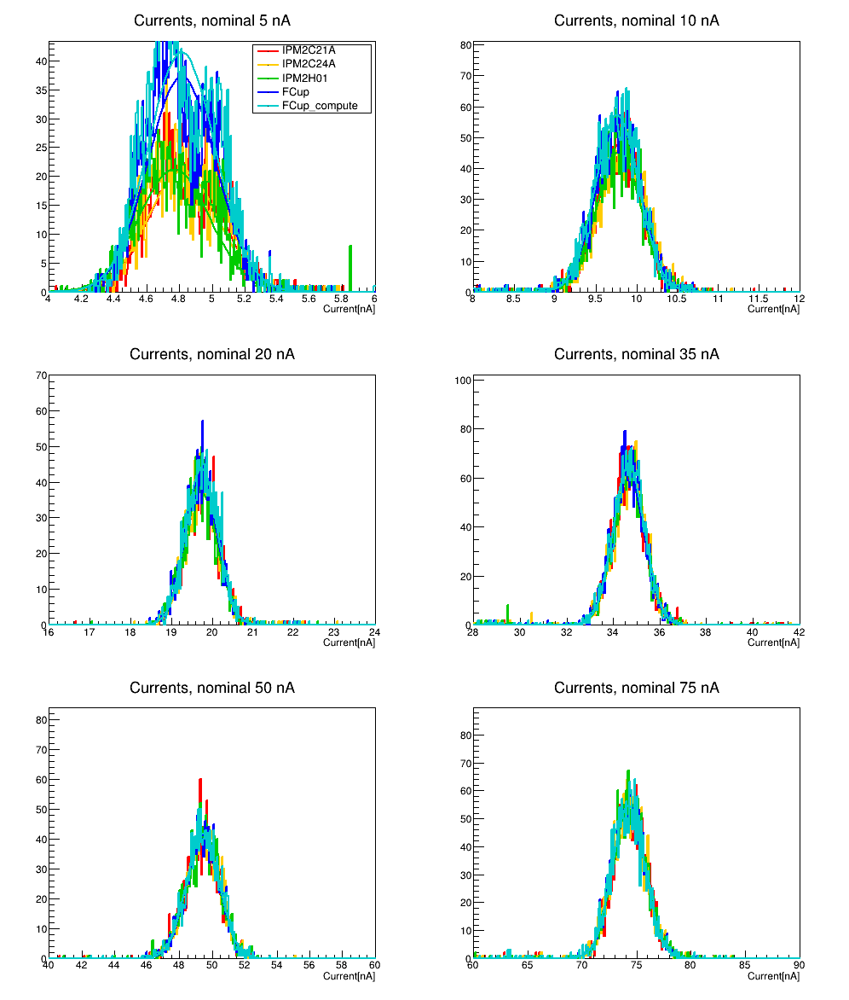

In [19]:
# We fill a set of ROOT histograms with the data from the Pandas Dataframes. 
# ROOT has nicer, better histograms that have a more familiar interface and look than Plotly.
# Two options for this: 
# 1) Convert Pandas DataFrame to a ROOT RDataFrame, then make histograms.
# 2) Fill the histograms directly from the Numpy arrays.
# This is method 2:
#
# Select the data to use: "value"  - uncorrected or "corr" - corrected
#
data_to_use = "corr"
target_name = "LD2"
#
%jsroot off
period = data_period.loc[data_period.target==target_name]
hists = []
fits = []
results = []
cc1 = R.TCanvas("cc1","CC1",1000,400*(len(period)//2))
cc1.Divide(2,len(period)//2)
color_to_R = {"red":R.kRed,"orange":R.kOrange,"green":R.kGreen+1,"blue":R.kBlue,"aqua":R.kCyan+1}

# Note: period was selected in the previous cell.
for i in range(len(period)):
    plot_start = period.iloc[i]["start_time"]
    plot_end = period.iloc[i]["end_time"]
    nominal_current = period.iloc[i]["current"]
    run_number = 0
    cc1.cd(i+1)
    hists.append({})
    results.append({})
    fits.append({})
    if i==0:
        legend = R.TLegend(0.6,0.67,0.89,0.89)
    for current, name, color in plot_set:
        select = (current.time>plot_start)&(current.time<plot_end)
        current_dat = current.loc[select].set_index("ms")
        numpy_dat = current_dat[data_to_use].to_numpy()
        if name.startswith("FCup"):
            numpy_dat *= period.iloc[i]["factor"]
        hists[-1][name] = R.TH1D(f"h_{name}_{i}",f"{name} {i};Current[nA]",300,nominal_current*0.8,nominal_current*1.2)
        hists[-1][name].FillN(numpy_dat.size, numpy_dat, np.ones(numpy_dat.size))
        hists[-1][name].SetMaximum(hists[-1][name].GetMaximum()*1.4)
        hists[-1][name].SetStats(0)
        hists[-1][name].SetTitle(f"Currents, nominal {nominal_current} nA")
        hists[-1][name].SetLineColor(color_to_R[color])
        hists[-1][name].SetLineWidth(2)
        hists[-1][name].Fit("gaus","0Q")
        fits[-1][name] = hists[-1][name].GetFunction("gaus")
        fits[-1][name].SetLineColor(color_to_R[color])
        hists[-1][name].Draw("same")
        fits[-1][name].Draw("same")
        if i==0:
            legend.AddEntry(hists[-1][name],name)
        results[-1][name] = [fits[-1][name].GetParameter(1),fits[-1][name].GetParError(1)]
        if name.startswith("FCup"):
            f = period.iloc[i]["factor"]
        else:
            f = 1
        # Note that we always *select* on the "value" for consistency in the data sample chosen.
        select = (current.time>plot_start)&(current.time<plot_end)&(current.value*f>nominal_current*0.8)&(current.value*f<nominal_current*1.2)
        results[-1][name+"_alt"] = [current.loc[select,data_to_use].mean()*f,current.loc[select,data_to_use].std()*f]
        
    if i==0:
        legend.Draw()
cc1.Draw()


***Figures:*** *Histograms of the currents for the same periods as the time histograms in the previous figure.*<br>
The data is not filtered, but the limits on the histograms effectively filter out the beam trip regions. Each curve is 
fit with a gaussian. Note that this is not quite correct for a period when the beam is not entire stable, i.e. there is 
a change in current, which would cause a double peak or a distortion.<br>
The results of the fits, and also the mean values of the histograms, are shown in the graphs below.

## Plot the means versus current
Taking the previous fit results, we can plot the difference of the central value for the BPMs and the Faraday cup against the current (central value of the FCup). If the data was perfectly corrected, this would be a flat line at y=1.  

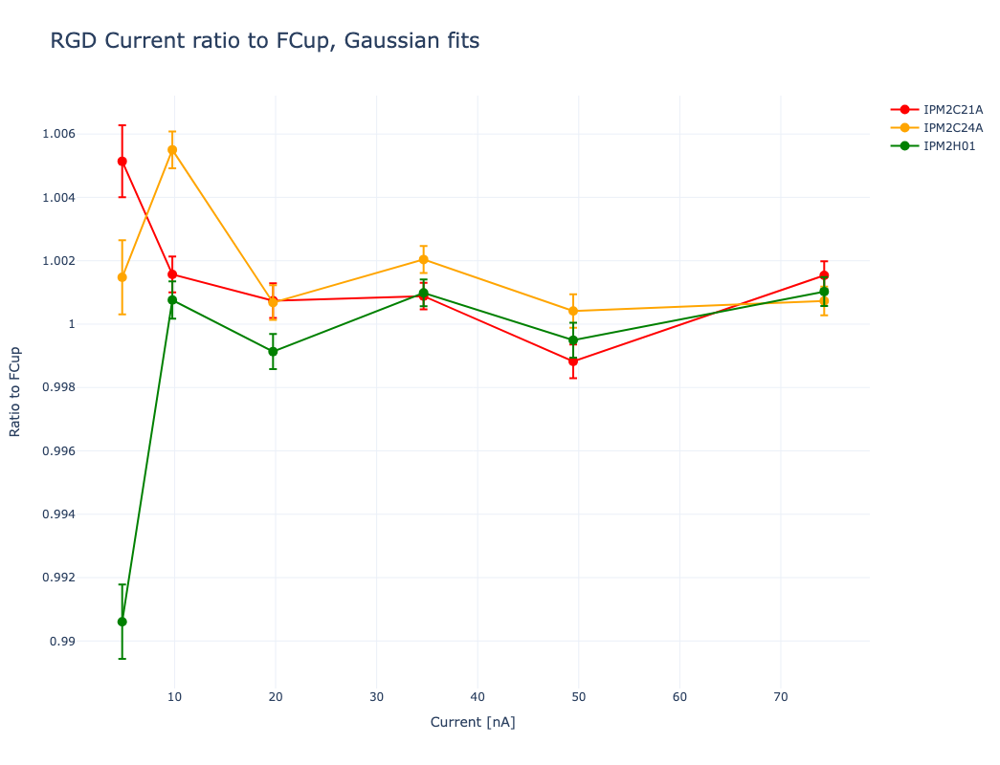

In [20]:
current_fcup=[]
ratio_to_fcup={}
ratio_to_fcup_std={}
for i in range(len(results)):
    current_fcup.append(results[i]["FCup"][0])
for current, name, color in plot_set:
    ratio_to_fcup[name] = []
    ratio_to_fcup_std[name] = []
    for i in range(len(results)):
        ratio_to_fcup[name].append(results[i][name][0]/results[i]["FCup"][0])
        ratio_to_fcup_std[name].append(results[i][name][1]/results[i]["FCup"][0])
        
fig = make_subplots()  # (specs=[[{"secondary_y": True}]])
fig.update_layout(width=1000, height=800,
    title=go.layout.Title(text=f"RGD Current ratio to FCup, Gaussian fits", xanchor="left"),
                      titlefont=dict(size=22),
                     xaxis_title="Current [nA]", yaxis_title="Ratio to FCup")
for current, name, color in plot_set:
    if not name.startswith("FCup"):
        fig.add_trace(go.Scatter(x=current_fcup, y=ratio_to_fcup[name], error_y=dict(array=ratio_to_fcup_std[name]),
                             name=name , line=dict(color=color), marker=dict(size=10), mode='markers+lines')
                 )
fig.show()

***Figure:*** Graphs for the centroid of the Gaussian fits. The errors on each value are the errors given by the fitting routine, 
which may be an underestimate of the actual uncertainty in the determination of the current.

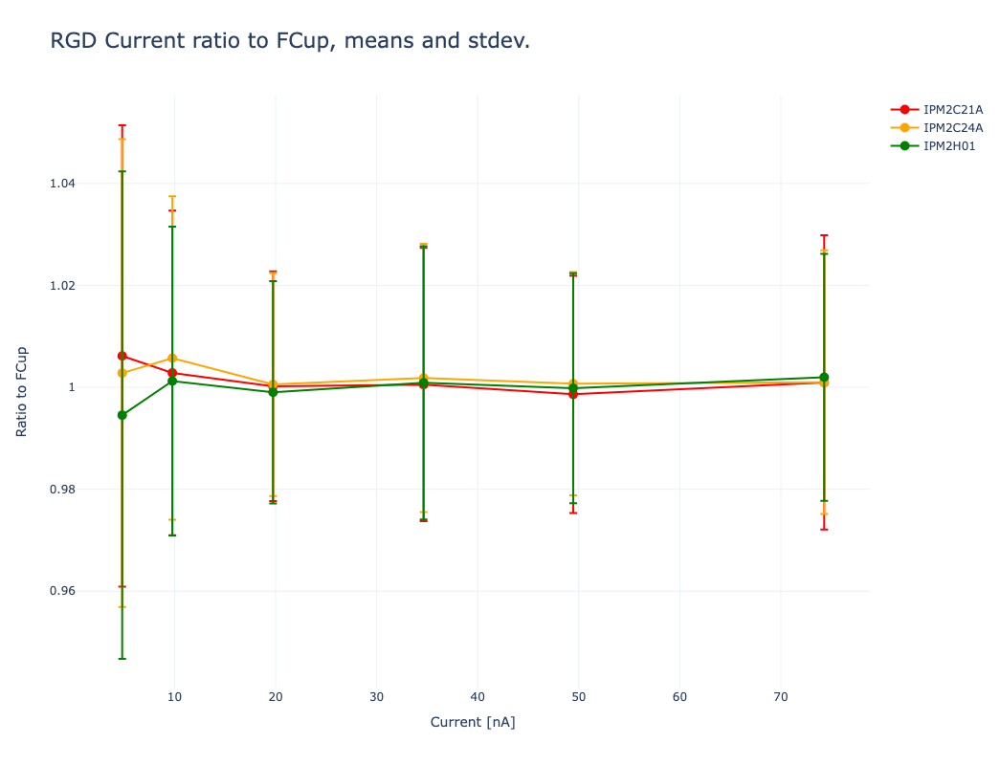

In [21]:
current_fcup_alt=[]
ratio_to_fcup_alt={}
ratio_to_fcup_std_alt={}
for i in range(len(results)):
    current_fcup_alt.append(results[i]["FCup_alt"][0])

for current, name, color in plot_set:
    ratio_to_fcup_alt[name] = []
    ratio_to_fcup_std_alt[name] = []
    for i in range(len(results)):
        ratio_to_fcup_alt[name].append(results[i][name+"_alt"][0]/results[i]["FCup_alt"][0])
        ratio_to_fcup_std_alt[name].append(results[i][name+"_alt"][1]/results[i]["FCup_alt"][0])

fig = make_subplots()  # (specs=[[{"secondary_y": True}]])
fig.update_layout(width=1000, height=800,
    title=go.layout.Title(text=f"RGD Current ratio to FCup, means and stdev.", xanchor="left"),
                      titlefont=dict(size=22),
                     xaxis_title="Current [nA]", yaxis_title="Ratio to FCup")
for current, name, color in plot_set:
    if not name.startswith("FCup"):
        fig.add_trace(go.Scatter(x=current_fcup, y=ratio_to_fcup_alt[name], error_y=dict(array=ratio_to_fcup_std_alt[name]),
                             name=name , line=dict(color=color), marker=dict(size=10), mode='markers+lines')
                 )
fig.show()

***Figure:*** Same plot as previous, but now the *mean* value for the data in the previous plots. The errors are now the standard deviation of the data, which would overestimate the uncertainty in the determination of the current.

# Correction Factors for BPMs
We take the results from the previous couple of steps and display it in a table. If the correction from the slope fits are not applied, the means calculated here could be used as a correction factor to the BPM values. So, for the corrected values these numbers show all be close to 1, meaning no correction.

In [22]:
def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and weighted standard deviation.
    values, weights -- NumPy ndarrays with the same shape.
    """
    average = np.average(values, weights=weights)
    # Fast and numerically precise:
    variance = np.average((values-average)**2, weights=weights)
    return (average, np.sqrt(variance))

out_string = """**Table:** Correction factors for the BPM current readings. Weighted values are a simple weighted average and standard error. The fit
is a linear regression of the results of the fit method, using 
[scipy.linregress](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html),
which does not take the data point errors into account. Also, the *r-value* is the Pearson r-value, not $R^2$.<br><br>\n"""
out_string += "| name | Weighted |          |  Unweighted |          | Fit       |            |       |       |\n"
out_string += "|-----:|:--------:|:--------:|:-----------:|:--------:|:---------:|:----------:|:-----:|:-----:|\n"
out_string += "|      |  **Fit** | **Mean** | **Fit**     | **Mean** | **Slope** | **Offset** | *r-value* | *p-value* |\n"
bpm_current_correction_factor={}
bpm_current_correction_factor_alt={}
bpm_current_slope_offset={}
bpm_current_slope_offset_alt={}

for current,name,color in plot_set:
    bpm_current_correction_factor[name]=weighted_avg_and_std(np.array(ratio_to_fcup[name]), weights=np.array(ratio_to_fcup_std[name]))
    bpm_current_correction_factor_alt[name]=weighted_avg_and_std(np.array(ratio_to_fcup_alt[name]), weights=np.array(ratio_to_fcup_std_alt[name]))
    bpm_current_slope_offset[name]= linregress(current_fcup, ratio_to_fcup[name])
    out_string+=f"| {name:>12s} | {bpm_current_correction_factor[name][0]:6.4f}±{bpm_current_correction_factor[name][1]:6.4f} "
    out_string+=f"| {bpm_current_correction_factor_alt[name][0]:6.4f}± {bpm_current_correction_factor_alt[name][1]:6.4f} "
    out_string+=f"| {np.array(ratio_to_fcup[name]).mean():6.4f}±{np.array(ratio_to_fcup[name]).std():6.4f} "
    out_string+=f"| {np.array(ratio_to_fcup_alt[name]).mean():6.4f}±{np.array(ratio_to_fcup[name]).std():6.4f}"
    out_string+=f"| {bpm_current_slope_offset[name].slope:11.3e}±{bpm_current_slope_offset[name].stderr:11.3e}"
    out_string+=f"| {bpm_current_slope_offset[name].intercept:6.4f}± {bpm_current_slope_offset[name].intercept_stderr:6.4f}"
    out_string+=f"| {bpm_current_slope_offset[name].rvalue**2:6.4f} | {bpm_current_slope_offset[name].pvalue:6.4f}|  \n"
display(Markdown(out_string))

**Table:** Correction factors for the BPM current readings. Weighted values are a simple weighted average and standard error. The fit
is a linear regression of the results of the fit method, using 
[scipy.linregress](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html),
which does not take the data point errors into account. Also, the *r-value* is the Pearson r-value, not $R^2$.<br><br>
| name | Weighted |          |  Unweighted |          | Fit       |            |       |       |
|-----:|:--------:|:--------:|:-----------:|:--------:|:---------:|:----------:|:-----:|:-----:|
|      |  **Fit** | **Mean** | **Fit**     | **Mean** | **Slope** | **Offset** | *r-value* | *p-value* |
|     IPM2C21A | 1.0021±0.0022 | 1.0021± 0.0026 | 1.0014±0.0019 | 1.0016±0.0019|  -3.959e-05±  3.377e-05| 1.0027± 0.0014| 0.2557 | 0.3061|  
|     IPM2C24A | 1.0018±0.0017 | 1.0024± 0.0018 | 1.0018±0.0017 | 1.0021±0.0017|  -3.689e-05±  3.106e-05| 1.0030± 0.0012| 0.2607 | 0.3007|  
|      IPM2H01 | 0.9972±0.0045 | 0.9990± 0.0029 | 0.9987±0.0037 | 0.9996±0.0037|   8.246e-05±  6.424e-05| 0.9960± 0.0026| 0.2918 | 0.2685|  
|         FCup | 1.0000±0.0000 | 1.0000± 0.0000 | 1.0000±0.0000 | 1.0000±0.0000|   0.000e+00±  0.000e+00| 1.0000± 0.0000| 0.0000 | 1.0000|  
| FCup_compute | 0.9999±0.0007 | 0.9999± 0.0005 | 0.9999±0.0007 | 1.0000±0.0007|   7.945e-06±  1.390e-05| 0.9997± 0.0006| 0.0755 | 0.5983|  


## Beam Blocker and Target Corrections

From the [logbook, October 8, 17:11](https://logbooks.jlab.org/entry/4195624), Rafo determined the attenuation correction for beam blocker and empty target to be 8.0421 <br>
From the [logbook, October 8, 17:03](https://logbooks.jlab.org/entry/4195622), he determined the attenuation correction for beam blocker and LD2 target to be 5.79985 <br>



In [23]:
FCup_beam_atten

,ms,value,time,run_number
0,1696755903999,NaN,2023-10-08 09:05:03.999,1
1,1696755945631,9.15080,2023-10-08 09:05:45.631,1
2,1696756623999,NaN,2023-10-08 09:17:03.999,1
3,1696756646027,9.15080,2023-10-08 09:17:26.027,1
4,1696784644008,5.79985,2023-10-08 17:04:04.008,1
5,1696938803999,NaN,2023-10-10 11:53:23.999,1
6,1696938850519,5.79985,2023-10-10 11:54:10.519,1
7,1698240604999,NaN,2023-10-25 13:30:04.999,1
8,1698240630526,5.79985,2023-10-25 13:30:30.526,1


In [24]:
for current,name,color in plot_set:
    if not name.startswith('FCup_compute'):
        current.loc[:,"corr"] = current.loc[:,"corr"]/bpm_current_correction_factor[name][0]

In [25]:
fcup_beamstop_corr = 1. + beam_stop_is_in(current_scalerS2b.time)*(5.833 - 1.)  
current_scalerS2b["value"] = (current_scalerS2b["value_orig"] - current_scalerS2b["offset"])/906.2
current_scalerS2b["corr"] = fcup_beamstop_corr*current_scalerS2b["value"]


# Write out the corrected current data.

In [27]:
# Store the corrected data from to a new HDF5 file
store = HDFStore("RGD_mya_data_corr_alt.h5", mode='w')
store.put("IPM2C21A", current_IPM2C21A)
store.put("IPM2C24A", current_IPM2C24A)
store.put("IPM2H01", current_IPM2H01)
store.put("scalerS2b", current_scalerS2b)
store.put("scaler_calc1b", current_FCup)
store.put("fcup_offset", FCup_offset)
store.put("fcup_slope", FCup_slope)
store.put("beam_stop", FCup_beam_stop)
store.put("beam_stop_atten", FCup_beam_atten)
store.put("DAQ_livetime", LT_DAQ)
store.put("Trigger_livetime", LT_Trigger)
store.put("Pulser_livetime", LT_clock)
store.close()


# EXPERIMENTAL AREA


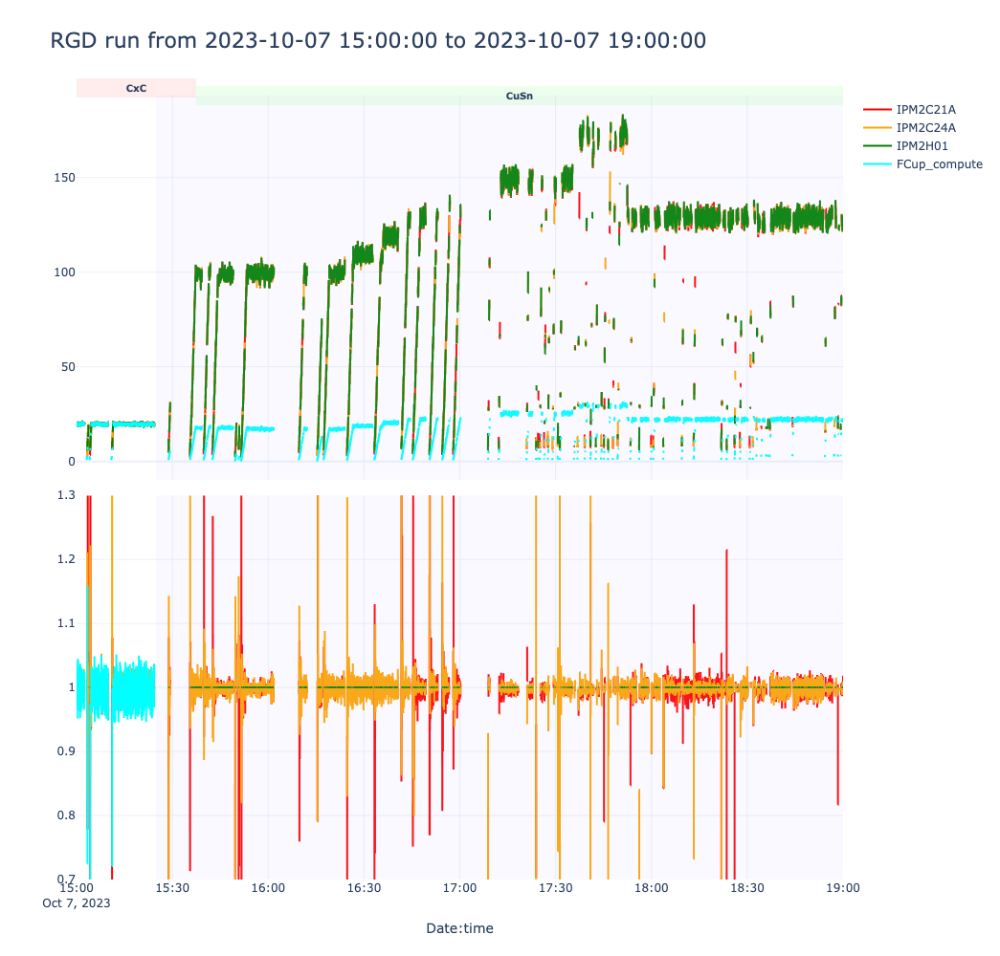

In [33]:
#i=10
#plot_start = period["start_time"][i]
#plot_end = period["end_time"][i]

window = 2    # This sets the beam trip blanking "window". If 0 no beam trip blanking is perfomed. If 1, 
plot_start = datetime(2023,10,7,15,0,0)
plot_end =   plot_start + timedelta(days=0, hours=4, minutes=0)

fig = make_subplots(rows=2, cols=1,shared_xaxes=True,
                    vertical_spacing=0.02)  # (specs=[[{"secondary_y": True}]])
fig.update_layout(width=1000, height=1000,
                  title=go.layout.Title(text=f"RGD run from {plot_start} to {plot_end}", xanchor="left"),
                  titlefont=dict(size=22))

plot_set2 = [
            (current_IPM2C21A,"IPM2C21A","red"), 
            (current_IPM2C24A,"IPM2C24A","orange"),
            (current_IPM2H01,"IPM2H01","green"),
            (current_scalerS2b,"FCup_compute","aqua"),
#            (current_FCup,"FCup","blue")
            ]

for current, name, color in plot_set2:
    select = (current.time>plot_start)&(current.time<plot_end) # &(current.value>40)
    select_IPM2H01 = (current_IPM2H01.time>plot_start)&(current_IPM2H01.time<plot_end) # &(current_IPM2H01.value>40)
    sample = current_selector_cleanup(current, select, 0, window)
    sample_IPM2H01 = current_selector_cleanup(current_IPM2H01, select_IPM2H01, 0, window)
    
    resample_time = '6min'
    resample_time = False
    
    if resample_time:
        resample = sample.resample(resample_time,on="time").mean()
        resample_IPM2H01 = current_IPM2H01.loc[select_IPM2H01].resample(resample_time,on="time").mean()
        c2h01 = np.interp(resample.index, resample_IPM2H01.index, resample_IPM2H01["corr"])

        fig.add_trace(go.Scatter(x=resample.index, y=resample["corr"],  name=name, line=dict(color=color, shape='hv')), row=1, col=1)
        fig.add_trace(go.Scatter(x=resample.index, y=resample["corr"]/c2h01, line=dict(color=color, shape='hv'), showlegend=False), row=2, col=1)
    else:
        c2h01 = np.interp(sample.loc[:,"time"], sample_IPM2H01.loc[:,"time"],sample_IPM2H01.loc[:,"corr"])
        fig.add_trace(go.Scatter(x=sample.loc[:,"time"], y=sample.loc[:,"corr"],  name=name, line=dict(color=color, shape='hv')),row=1, col=1)
        fig.add_trace(go.Scatter(x=sample.loc[:,"time"], y=sample.loc[:,"corr"]/c2h01, line=dict(color=color, shape='hv'),showlegend=False),row=2, col=1)

for i in range(len(beam_stop_in_start)):
    if beam_stop_in_end[i] > plot_start and beam_stop_in_start[i] < plot_end:
        fig.add_vrect(x0=max(beam_stop_in_start[i],plot_start),x1=min(beam_stop_in_end[i],plot_end), fillcolor="#C0C0FF", opacity=0.1, line_width=0)

target_labels={'empty':(1.06,"#B0B0B0"),'LD2':(1.04,"#A0A0FF"),'CxC':(1.02,"#FFA0A0"),'CuSn':(1.,"#A0FFA0")}
        
for i in range(len(target_change_table)-1):
    time0 = max(target_change_table.iloc[i].name, plot_start)
    time1 = min(target_change_table.iloc[i+1].name, plot_end) 
    target = target_change_table.iloc[i].target
    if time1 > plot_start and time0 < plot_end:
        y_pos = target_labels[target][0]
        fig.add_vrect(x0=time0, x1=time1, xref="x", y0=y_pos-0.025, y1=y_pos+0.025, yref='paper', fillcolor=target_labels[target][1], opacity=0.2, line_width=0, row=1, col=1,
                     label=dict(text="<b>"+target+"</b>", font=dict(size=10)))
             
if plot_start < end_time_commissioning:
    fig.add_vrect(x0=plot_start,x1=end_time_commissioning, fillcolor="#FF9090", opacity=0.2, line_width=0)
        
# fig.update_layout(yaxis2 = dict(range=[0.7, 1.3 ]),
#                  xaxis_title="Date:time", yaxis_title="Current [nA]", yaxis2_title="$\Delta$")
fig.update_xaxes(title_text="Date:time", row=2, col=1)
fig.update_yaxes(title_text="$\mathrm{Current[nA]}$", row=1, col=1)
fig.update_yaxes(title_text="$\Delta \mathrm{Current[nA]}$", range=[0.7, 1.3 ], row=2, col=1)
fig.show()

In [21]:
current_IPM2C21A.iloc[0]

ms                         1696412577961
value                               0.78
time          2023-10-04 09:42:57.961000
run_number                             1
corr                            0.542374
Name: 0, dtype: object

In [22]:
df.iloc[0]

number                                                              18305
start_time                                            2023-10-04 09:45:16
end_time                                              2023-10-04 10:21:17
is_valid_run_end                                                    False
user_comment                                       Trigger validation run
run_type                                                       PROD66_PIN
target                                                                LD2
beam_current_request                                                35 nA
operators                    expert: Caleb Fogler, worker: Marshall Scott
event_count                                                      32238148
events_rate                                                       338.229
run_config                                             rgd_v1.0_30kHz.cnf
status                                                                  0
evio_files_count                      